# Project2 : Tissue classification in primary colorectal tumors
## Yingxi Yang for DCGAN, Kyle Kwan Long Wong for PCA
## Hanli Huang for Classification

<img src="http://pictes.oss-cn-beijing.aliyuncs.com/microclass-virtualisation/week1correlation/line4.png" 
align="center" />

![avatar](./icon.png)

## DCGAN

In [2]:
import numpy as np
#import tensorflow as tf
import tensorflow.compat.v1 as tf   # if this line has errors, please uncomment this line and comment the above line
tf.disable_v2_behavior()
import pickle
import matplotlib.pyplot as plt
import warnings
import pandas as pd
import os

warnings.filterwarnings("ignore")
%matplotlib inline

In [3]:
#please install opencv-python (pip3 install opencv-python)

In [4]:
print("TensorFlow Version: {}".format(tf.__version__))

TensorFlow Version: 1.13.1


### Data preprocessing

#### Input data

In [12]:
train_all_x =pd.read_csv('processed_data/training_feature.csv',header=None) # all training features include two classes
train_all_y =pd.read_csv('processed_data/training_label.csv',header=None)

In [13]:
train_all_x 

,0,1,2,3,4,5,6,7,8,9,...,67490,67491,67492,67493,67494,67495,67496,67497,67498,67499
0,85,28,83,86,34,101,86,34,101,62,...,65,81,34,90,89,42,98,93,38,93
1,94,56,132,87,59,129,109,81,151,131,...,134,80,38,93,65,23,78,65,25,97
2,80,32,50,87,34,67,108,55,88,114,...,79,94,45,103,90,41,99,95,42,93
3,102,61,122,95,46,127,84,35,116,79,...,230,224,215,228,211,202,215,189,153,207
4,77,27,75,73,30,73,70,27,70,60,...,88,88,41,93,89,42,94,95,49,115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,230,222,233,238,226,244,234,222,240,222,...,214,178,140,216,175,137,213,164,129,203
1046,72,33,132,85,46,145,102,59,156,102,...,166,111,75,165,127,87,192,145,105,210
1047,114,70,170,111,66,162,105,60,156,101,...,140,114,69,149,111,66,146,106,66,143
1048,198,163,197,227,198,223,240,211,236,236,...,190,179,141,190,169,131,180,141,102,153


In [14]:
if not os.path.exists('training_result'):
    os.mkdir('training_result')
if not os.path.exists('model'):
    os.mkdir('model')
if not os.path.exists('generated_result'):
    os.mkdir('generated_result')

In [15]:
#divide all training features into two individual training features
train_x_list = []
for i in range(2):
    tmp_train = train_all_x[train_all_y[0]==(i+1)]
    tmp_train.reset_index(drop='index',inplace=True)
    train_x_list.append(tmp_train)

In [16]:
class_name = ['01_TUMOR','02_STROMA']

In [20]:
# If the class '01_TUMOR' is input into DCGAN, flag_class = 1, otherwise flag_class = 2
flag_class = 1 

class_num = train_x_list[flag_class-1].shape[0]
train_x = np.array(train_x_list[flag_class-1]).reshape((class_num,150,150,3)).transpose(0, 1, 2, 3)

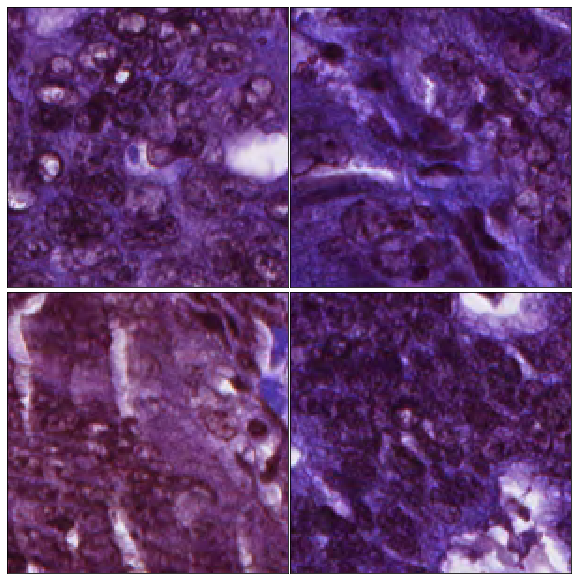

In [34]:
# check if the data after grey process is consist with the original data
fig, axes = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True, figsize=(8,8))
imgs = train_x[:4]

for image, row in zip([imgs[:2], imgs[2:4]], axes):
    for img, ax in zip(image, row):
        ax.imshow(img)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

fig.tight_layout(pad=0.5)

#### Normalization

In [35]:
from sklearn.preprocessing import MinMaxScaler
minmax = MinMaxScaler()
tmp_x = train_x.reshape(train_x.shape[0],150*150*3)
X_train = minmax.fit_transform(tmp_x)

In [36]:
X_train = X_train.reshape(train_x.shape[0],150,150,3)

### Intput

In [39]:
def get_inputs(noise_dim, image_height, image_width, image_depth):
    """
    :param noise_dim: 
    :param image_height: 
    :param image_width: 
    :param image_depth: 
    """ 
    inputs_real = tf.placeholder(tf.float32, [None, image_height, image_width, image_depth], name='inputs_real')
    inputs_noise = tf.placeholder(tf.float32, [None, noise_dim], name='inputs_noise')
    
    return inputs_real, inputs_noise

### Generator

In [40]:
def get_generator(noise_img, output_dim, is_train=True, alpha=0.01):
    """
    :param noise_img: 
    :param output_dim: 
    :param is_train: 
    :param alpha: 
    """
    
    with tf.variable_scope("generator", reuse=(not is_train)):
        # 100 x 1 to 5 x 5 x 512
        # full connect
        layer1 = tf.layers.dense(noise_img, 5*5*512)
        layer1 = tf.reshape(layer1, [-1, 5, 5, 512])
        # batch normalization
        layer1 = tf.layers.batch_normalization(layer1, training=is_train)
        # Leaky ReLU
        layer1 = tf.maximum(alpha * layer1, layer1)
        # dropout
        layer1 = tf.nn.dropout(layer1, keep_prob=0.8)
        
        # 5 x 5 x 512 to 15 x 15 x 256
        layer2 = tf.layers.conv2d_transpose(layer1, 256, 5, strides=3, padding='same')
        layer2 = tf.layers.batch_normalization(layer2, training=is_train)
        layer2 = tf.maximum(alpha * layer2, layer2)
        layer2 = tf.nn.dropout(layer2, keep_prob=0.8)
        
        # 15 x 15 256 to 75 x 75 x 64
        layer3 = tf.layers.conv2d_transpose(layer2, 64, 5, strides=5, padding='same')
        layer3 = tf.layers.batch_normalization(layer3, training=is_train)
        layer3 = tf.maximum(alpha * layer3, layer3)
        layer3 = tf.nn.dropout(layer3, keep_prob=0.8)
        
        # 75 x 75 x 64 to 150 x 150 x 3
        logits = tf.layers.conv2d_transpose(layer3, output_dim, 3, strides=2, padding='same')
        outputs = tf.tanh(logits)
        
        return outputs

### Discriminator

In [41]:
def get_discriminator(inputs_img, reuse=False, alpha=0.01):
    """
    @param inputs_img: 
    @param alpha: 
    """
    
    with tf.variable_scope("discriminator", reuse=reuse):
        # 150 x 150 x 3 to 75 x 75 x 64
        layer1 = tf.layers.conv2d(inputs_img, 64, 3, strides=2, padding='same')
        layer1 = tf.maximum(alpha * layer1, layer1)
        layer1 = tf.nn.dropout(layer1, keep_prob=0.8)
        
        # 75 x 75 x 64 to 15 x 15 x 256
        layer2 = tf.layers.conv2d(layer1, 256, 5, strides=5, padding='same')
        layer2 = tf.layers.batch_normalization(layer2, training=True)
        layer2 = tf.maximum(alpha * layer2, layer2)
        layer2 = tf.nn.dropout(layer2, keep_prob=0.8)
        
        # 15 x 15 x 256 to 5 x 5 x 512
        layer3 = tf.layers.conv2d(layer2, 512, 5, strides=3, padding='same')
        layer3 = tf.layers.batch_normalization(layer3, training=True)
        layer3 = tf.maximum(alpha * layer3, layer3)
        layer3 = tf.nn.dropout(layer3, keep_prob=0.8)
        
        # 5 x 5 x 512 to 5*5*512 x 1
        flatten = tf.reshape(layer3, (-1, 5*5*512))
        logits = tf.layers.dense(flatten, 1)
        outputs = tf.sigmoid(logits)
        
        return logits, outputs

### Loss

In [42]:
def get_loss(inputs_real, inputs_noise, image_depth, smooth=0.1):
    """
    @param inputs_real: 
    @param inputs_noise: 
    @param image_depth: 
    @param smooth: 
    """
    
    g_outputs = get_generator(inputs_noise, image_depth, is_train=True)
    d_logits_real, d_outputs_real = get_discriminator(inputs_real)
    d_logits_fake, d_outputs_fake = get_discriminator(g_outputs, reuse=True)
    
    # Loss
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                                    labels=tf.ones_like(d_outputs_fake)*(1-smooth)))
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                                         labels=tf.ones_like(d_outputs_real)*(1-smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                         labels=tf.zeros_like(d_outputs_fake)))
    d_loss = tf.add(d_loss_real, d_loss_fake)
    
    return g_loss, d_loss

### Optimizer

In [43]:
def get_optimizer(g_loss, d_loss, beta1=0.4, learning_rate=0.001):
    """
    @param g_loss: Generator Loss
    @param d_loss: Discriminator Loss
    @learning_rate
    """
    
    train_vars = tf.trainable_variables()
    
    g_vars = [var for var in train_vars if var.name.startswith("generator")]
    d_vars = [var for var in train_vars if var.name.startswith("discriminator")]
    
    # Optimizer
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        d_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    
    return g_opt, d_opt

In [55]:
def plot_images(samples,save_dir):
    samples = (samples + 1) / 2
    fig, axes = plt.subplots(nrows=1, ncols=8, sharex=True, sharey=True, figsize=(16,2))
    for img, ax in zip(samples, axes):
        ax.imshow(img.reshape((150, 150, 3)))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    fig.tight_layout(pad=0)
    fig.savefig(save_dir)

In [45]:
def show_generator_output(sess, n_images, inputs_noise, output_dim):
    """
    @param sess: TensorFlow session
    @param n_images: 
    @param inputs_noise: 
    @param output_dim:
    @param image_mode:
    """
    #cmap = 'Greys_r'
    noise_shape = inputs_noise.get_shape().as_list()[-1]
    examples_noise = np.random.uniform(-1, 1, size=[n_images, noise_shape])
    samples = sess.run(get_generator(inputs_noise, output_dim, False),
                       feed_dict={inputs_noise: examples_noise})
    return samples

In [56]:
def generating_image(sess, nsamples, noise_size, data_shape):
    inputs_real, inputs_noise = get_inputs(noise_size, data_shape[1], data_shape[2], data_shape[3])
    samples = show_generator_output(sess, nsamples, inputs_noise, data_shape[-1])
    fig_path = 'generated_result/'+class_name[flag_class-1]
    if not os.path.exists(fig_path):
        os.mkdir(fig_path)
    samples_save = samples.reshape(nsamples,-1)
    pd.DataFrame(samples_save).to_csv(fig_path+'/'+str(nsamples)+'_g.csv',index=None,header=None)
    samples = (samples + 1) / 2
    i = 1
    for img in samples:
        fig, ax = plt.subplots(nrows=1, ncols=1, sharex=True, sharey=True, figsize=(4,4))
        ax.imshow(img.reshape((150, 150, 3)))
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        fig.savefig(fig_path+'/'+str(i)+'.png')
        i+=1    

### Train

In [53]:
batch_size = 75
noise_size = 100
epochs = 1000
n_samples = 15
learning_rate = 0.001
beta1 = 0.4

In [48]:
def train(noise_size, data_shape, batch_size, n_samples):
    """
    @param noise_size: 
    @param data_shape: 
    @batch_size:
    @n_samples:
    """
    
    # save loss
    losses = []
    steps = 0
    
    inputs_real, inputs_noise = get_inputs(noise_size, data_shape[1], data_shape[2], data_shape[3])
    g_loss, d_loss = get_loss(inputs_real, inputs_noise, data_shape[-1])
    g_train_opt, d_train_opt = get_optimizer(g_loss, d_loss, beta1, learning_rate)
    saver = tf.train.Saver() 
    fig_path = 'training_result/'+class_name[flag_class-1]
    if not os.path.exists(fig_path):
        os.mkdir(fig_path)
    saver_path = 'model/'+class_name[flag_class-1]
    if not os.path.exists(saver_path):
        os.mkdir(saver_path)
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        # epoch
        for e in range(epochs):
            np.random.shuffle(X_train)
            for batch_i in range(X_train.shape[0]//batch_size-1):
                steps += 1
                batch_images = X_train[batch_i * batch_size: (batch_i+1)*batch_size]

                # scale to -1, 1
                batch_images = batch_images * 2 - 1

                # noise
                batch_noise = np.random.uniform(-1, 1, size=(batch_size, noise_size))

                # run optimizer
                _ = sess.run(g_train_opt, feed_dict={inputs_real: batch_images,
                                                     inputs_noise: batch_noise})
                _ = sess.run(d_train_opt, feed_dict={inputs_real: batch_images,
                                                     inputs_noise: batch_noise})
                
                if (steps-1) % 7 == 0:
                    train_loss_d = d_loss.eval({inputs_real: batch_images,
                                                inputs_noise: batch_noise})
                    train_loss_g = g_loss.eval({inputs_real: batch_images,
                                                inputs_noise: batch_noise})
                    losses.append((train_loss_d, train_loss_g))

                    samples = show_generator_output(sess, n_samples, inputs_noise, data_shape[-1])
                    tmp_fig = '/steps_'+str(steps)+'.png'
                    plot_images(samples,fig_path+tmp_fig)
                    print("Epoch {}/{}....".format(e+1, epochs), 
                          "Discriminator Loss: {:.4f}....".format(train_loss_d),
                          "Generator Loss: {:.4f}....". format(train_loss_g))
        pd.DataFrame(losses).to_csv(fig_path+'_Dloss_Gloss.csv',index=None,header=None)
        saver.save(sess, saver_path+'/model_'+str(flag_class)+'_'+str(e)+'_.ckpt')
        generating_image(sess,105,noise_size,[-1,150,150,3])
                                   

## PCA

In [2]:
import numpy as np
from imageio import imread
import matplotlib.pyplot as plt
from IPython.display import HTML, Image
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd

%matplotlib inline 

100
===== loading image 1


C:\Users\Par2\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


===== loading image 2
===== loading image 3
===== loading image 4
===== loading image 5
===== loading image 6
===== loading image 7
===== loading image 8
===== loading image 9
===== loading image 10
===== loading image 11
===== loading image 12
===== loading image 13
===== loading image 14
===== loading image 15
===== loading image 16
===== loading image 17
===== loading image 18
===== loading image 19
===== loading image 20
===== loading image 21
===== loading image 22
===== loading image 23
===== loading image 24
===== loading image 25
===== loading image 26
===== loading image 27
===== loading image 28
===== loading image 29
===== loading image 30
===== loading image 31
===== loading image 32
===== loading image 33
===== loading image 34
===== loading image 35
===== loading image 36
===== loading image 37
===== loading image 38
===== loading image 39
===== loading image 40
===== loading image 41
===== loading image 42
===== loading image 43
===== loading image 44
===== loading image

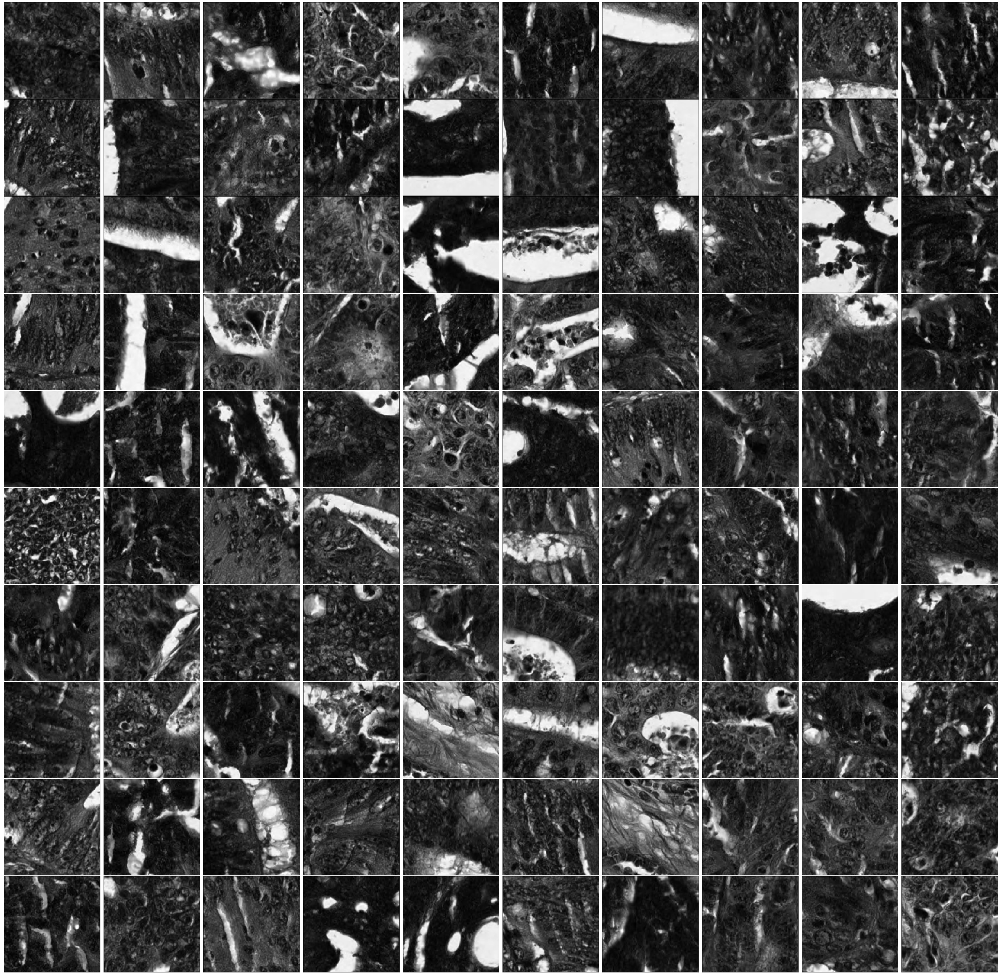

In [5]:
# Read the images to make sure data is correct
import glob
import pandas as pd
from scipy.misc import imread

# Declare the directory for the file
save_dir = 'C:/Users/Par2/Downloads/CSICdata 2/CSICdata 2/colorectal cancer histology/Kather_texture_2016_image_tiles_5000/Inde_test/01_TUMOR/photo/'
# Initialise the array for the flatten image
faces = pd.DataFrame([])

# Loop image from the folder
# Preprocess by normalising, converting into grayscale, and flattening into an array
imagepaths = glob.glob('C:/Users/Par2/Downloads/CSICdata 2/CSICdata 2/colorectal cancer histology/Kather_texture_2016_image_tiles_5000/Inde_test/01_TUMOR/*.tif', recursive=True)  
print(len(imagepaths))
for i, path in enumerate(imagepaths):
    print("===== loading image", i+1)
    img = imread(path)
    img=img[:,:,1]
    img = img.astype(np.uint8)
    img = img / 255
    img = img.flatten()
    data_entry = pd.DataFrame([img]) 
    faces = faces.append(data_entry)   

# Display number of features in the image = (22500)
print(img.shape)

# Visualisation and save the image into the specified folder
fig, axes = plt.subplots(10,10,figsize=(50,50), subplot_kw={'xticks':[], 'yticks':[]}, gridspec_kw=dict(hspace=0.01, wspace=0.01))
for i, ax in enumerate(axes.flat):
    ax.imshow(faces.iloc[i].values.reshape(150,150),cmap='gray')
    image = faces.iloc[i].values.reshape(150,150)
    plt.imsave(save_dir + "{}.png".format(i), image, cmap="gray_r")

(525, 150, 150, 3)
(150, 150, 3)
(150, 150, 3)
(150, 150)
[[132 129 151 ... 162 147 129]
 [ 92 101 131 ... 144 127  97]
 [ 69  96 120 ... 128 120  91]
 ...
 [129 128 126 ...  95  84 108]
 [142 135 129 ...  96  68  95]
 [141 137 141 ...  93  78  97]]


Text(0, 0.5, 'cumulative sum')

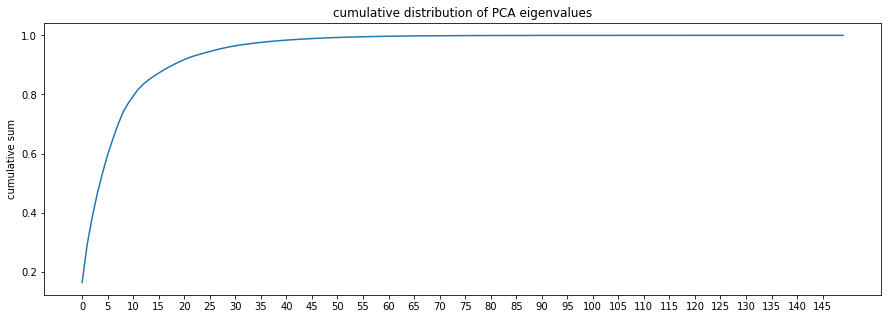

In [7]:
#Plot cumulative distribution
import os 
from PIL import Image
from glob import iglob

#change path according to the dataset of interest
dirname = 'C:/Users/Par2/Downloads/CSICdata 2/CSICdata 2/colorectal cancer histology/Kather_texture_2016_image_tiles_5000/Train/01_TUMOR'
final = []
for fname in os.listdir(dirname):
    im = Image.open(os.path.join(dirname, fname))
    imarray = np.array(im)
    image = final.append(imarray)

# Extract only x and y coordinates
final = np.asarray(final)
print(final.shape)
print(imarray.shape)
final = final[1,:]
print(final.shape)
final=final[:,:,0]
print(final.shape)
print(final)

# Create PCA model
image_pca=PCA(150)
# fit Data
image_pca.fit(final)
# Estimate the cumulative distribution of the eigenvalues
cumulative_sum=np.cumsum(image_pca.explained_variance_ratio_)
# plot the distribution
plt.figure(figsize = [15,5])
plt.plot(cumulative_sum)
plt.xticks(np.arange(0,image_pca.explained_variance_ratio_.shape[0],5))
plt.title('cumulative distribution of PCA eigenvalues')
plt.ylabel('cumulative sum')
plt.ylabel('cumulative sum')

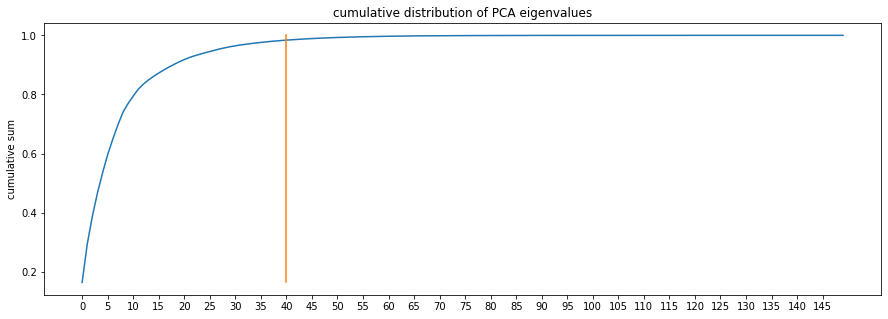

In [8]:
# re-plot the distribution
plt.figure(figsize = [15,5])
plt.plot(cumulative_sum)
plt.xticks(np.arange(0,image_pca.explained_variance_ratio_.shape[0],5))
plt.title('cumulative distribution of PCA eigenvalues')
plt.ylabel('cumulative sum')
plt.ylabel('cumulative sum')


# now select lines parallel to the y-axis e.g. plot the line x=40
x=np.ones(10)*40
y=np.linspace(image_pca.explained_variance_ratio_[0],1,10)
plt.plot(x,y)

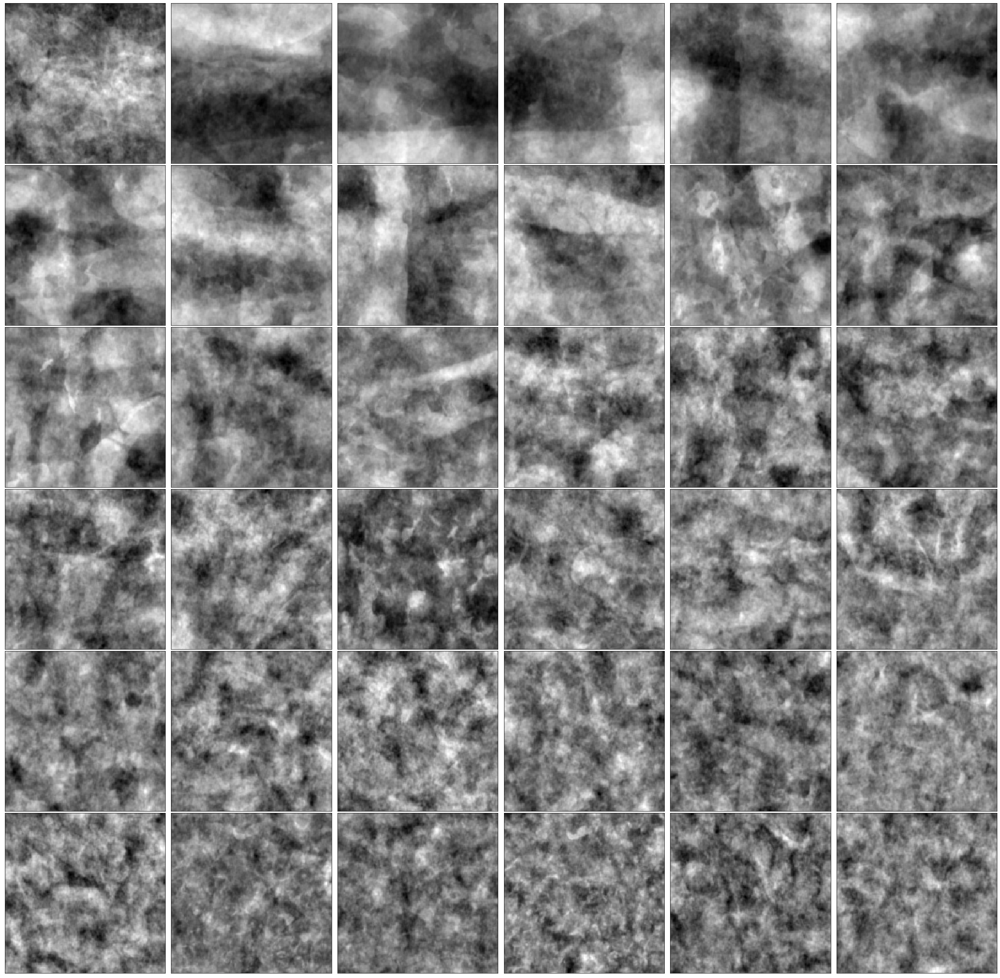

In [6]:
#Perform PCA on the images
from sklearn.decomposition import PCA
faces_pca = PCA(n_components=40)#determined from cumulative distribution
faces_pca.fit(faces)
fig, axes = plt.subplots(6,6,figsize=(40,40), subplot_kw={'xticks':[], 'yticks':[]}, gridspec_kw=dict(hspace=0.01, wspace=0.01))
for i, ax in enumerate(axes.flat):
 ax.imshow(faces_pca.components_[i].reshape(150,150),cmap='gray')

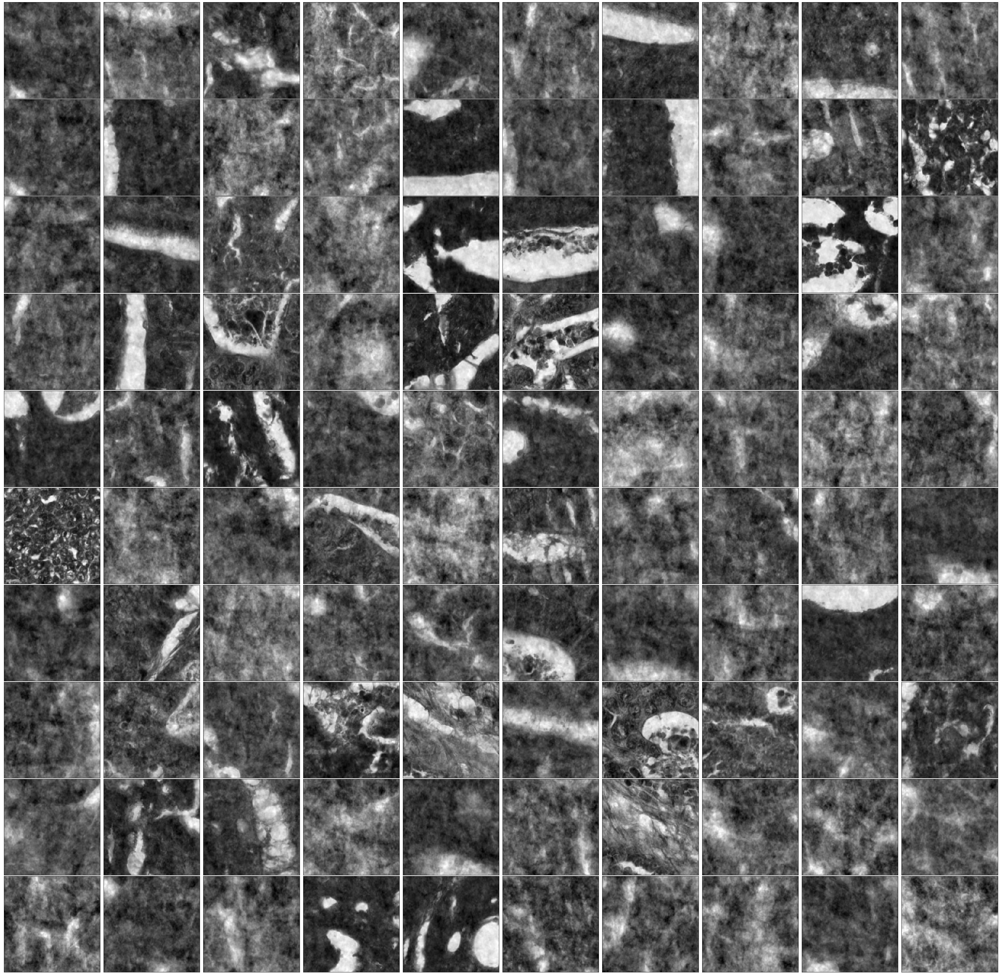

In [7]:

import scipy.misc
import matplotlib, cv2

# Image reconstruction by performing inverse PCA
# Initialise count for the loop
count = 1
save_dir = 'C:/Users/Par2/Downloads/CSICdata 2/CSICdata 2/colorectal cancer histology/Kather_texture_2016_image_tiles_5000/Inde_test/01_TUMOR/photo2/'
components = faces_pca.transform(faces)
projected = faces_pca.inverse_transform(components)
fig, axes = plt.subplots(10,10,figsize=(50,50), 
subplot_kw={'xticks':[], 'yticks':[]},
gridspec_kw=dict(hspace=0.01, wspace=0.01))

# Visualisation and save the images into the folder
for i, ax in enumerate(axes.flat):
    ax.imshow(projected[i].reshape(150,150),cmap='gray')
    image = projected[i].reshape(150,150)
    plt.imsave(save_dir + "{}.png".format(i), image, cmap="gray_r")

Text(0.5, 1.0, 'After')

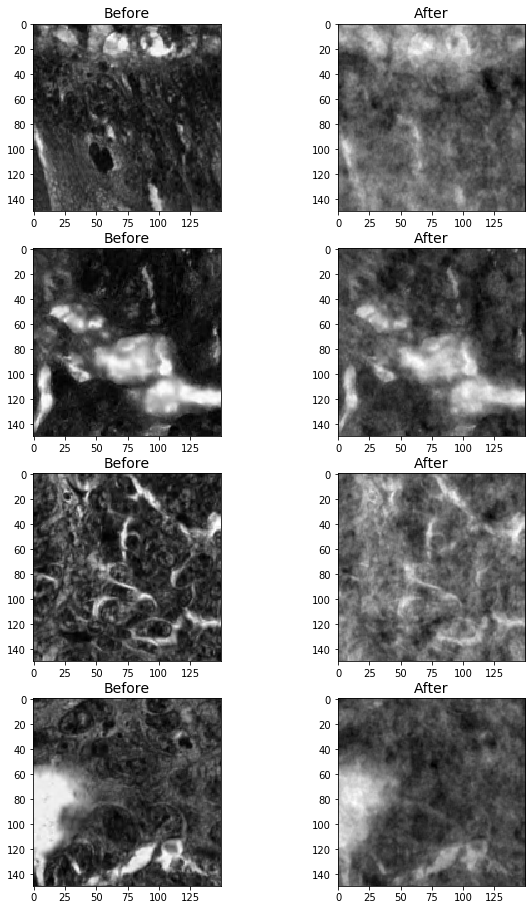

In [8]:
# Visualisation; comparison between before and after PCA
# dimensionality reduction from 22500 features to 40 features
i=1
j=2
k=3
l=4
plt.figure(figsize=[10,20])
plt.set_cmap('gray')
plt.subplot(521)
plt.imshow(faces.iloc[i].values.reshape(150,150))
plt.title('Before', fontsize = 14)
plt.subplot(522)
plt.imshow(projected[i].reshape(150,150))
plt.title('After', fontsize = 14)
plt.subplot(523)
plt.imshow(faces.iloc[j].values.reshape(150,150))
plt.title('Before', fontsize = 14)
plt.subplot(524)
plt.imshow(projected[j].reshape(150,150))
plt.title('After', fontsize = 14)
plt.subplot(525)
plt.imshow(faces.iloc[k].values.reshape(150,150))
plt.title('Before', fontsize = 14)
plt.subplot(526)
plt.imshow(projected[k].reshape(150,150))
plt.title('After', fontsize = 14)
plt.subplot(527)
plt.imshow(faces.iloc[l].values.reshape(150,150))
plt.title('Before', fontsize = 14)
plt.subplot(528)
plt.imshow(projected[l].reshape(150,150))
plt.title('After', fontsize = 14)

## Inception V3

In [1]:
from keras import applications
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.utils import multi_gpu_model
from keras.models import Sequential, Model
from keras.layers import Dropout, Flatten, Dense, Input, GlobalAveragePooling2D
from tensorflow.contrib.keras.api.keras.callbacks import Callback
from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
import os
os.environ["CUDA_VISIBLE_DEVICES"]="3"

Using TensorFlow backend.
/home/stand/anaconda3/envs/aipa/lib/python3.6/site-packages/dask/config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [2]:
class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.losses = {'batch':[], 'epoch':[]}
        self.accuracy = {'batch':[], 'epoch':[]}
        self.val_loss = {'batch':[], 'epoch':[]}
        self.val_acc = {'batch':[], 'epoch':[]}

    def on_batch_end(self, batch, logs={}):
        self.losses['batch'].append(logs.get('loss'))
        self.accuracy['batch'].append(logs.get('acc'))
        self.val_loss['batch'].append(logs.get('val_loss'))
        self.val_acc['batch'].append(logs.get('val_acc'))

    def on_epoch_end(self, batch, logs={}):
        self.losses['epoch'].append(logs.get('loss'))
        self.accuracy['epoch'].append(logs.get('acc'))
        self.val_loss['epoch'].append(logs.get('val_loss'))
        self.val_acc['epoch'].append(logs.get('val_acc'))

    def loss_plot(self, loss_type, model_name):
        iters = range(len(self.losses[loss_type]))
        plt.figure()
        # acc
        plt.plot(iters, self.accuracy[loss_type], 'r', label='train acc')
        # loss
        plt.plot(iters, self.losses[loss_type], 'g', label='train loss')
        if loss_type == 'epoch':
            # val_acc
            plt.plot(iters, self.val_acc[loss_type], 'b', label='val acc')
            # val_loss
            plt.plot(iters, self.val_loss[loss_type], 'k', label='val loss')
        plt.grid(True)
        plt.xlabel(loss_type)
        plt.ylabel('acc-loss')
        plt.legend(loc="right")
        plt.title(model_name+' Training Curve')
        plt.savefig(model_name+'.png',dpi=300)

In [7]:
# path to the model weights files.
model_name = 'V3_GAN_PCA'
full_model_weights_path = '/media/disk1/Necrosis/model/'+ model_name + '_weight.h5'
full_model_path = '/media/disk1/Necrosis/model/'+ model_name + '_model.h5'
# dimensions of our images.
img_width, img_height = 150, 150

train_data_dir = '/home/stand/Greyscale/GAN-PCA-Reconstructed'
nb_train_samples = 525*2
epochs = 100
batch_size = 20

In [11]:
!ls /home/stand/Greyscale/Original/Train

Original_Stroma_Train  Original_Tumour_Train


In [8]:
# build the InceptionV3 network
input_tensor = Input(shape=(img_height, img_width, 3))
base_model = applications.InceptionV3(weights='imagenet', include_top=False, input_tensor=input_tensor)
print('Model loaded.')
# build top model
x = GlobalAveragePooling2D(name='avg_pool')(base_model.output)
#x = Dense(3, activation='sigmoid', name='predictions')(x)
x = Dense(2, activation='softmax', name='predictions')(x)
# stitch together
model = Model(inputs= base_model.input, outputs=x)

# inspect
model.summary()

Model loaded.
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 150, 150, 3)  0                                            
__________________________________________________________________________________________________
conv2d_95 (Conv2D)              (None, 74, 74, 32)   864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_95 (BatchNo (None, 74, 74, 32)   96          conv2d_95[0][0]                  
__________________________________________________________________________________________________
activation_95 (Activation)      (None, 74, 74, 32)   0           batch_normalization_95[0][0]     
_______________________________________________________________________________________________

Found 840 images belonging to 2 classes.
Found 210 images belonging to 2 classes.
Epoch 1/100
42/42 [==============================] - 16s 376ms/step - loss: 0.7084 - acc: 0.5690 - val_loss: 0.7131 - val_acc: 0.5900

Epoch 00001: val_acc improved from -inf to 0.59000, saving model to /media/disk1/Necrosis/model/V3_GAN_PCA_weights-improvement-01-0.59.hdf5
Epoch 2/100
42/42 [==============================] - 4s 92ms/step - loss: 0.5551 - acc: 0.7393 - val_loss: 0.8473 - val_acc: 0.5632

Epoch 00002: val_acc did not improve from 0.59000
Epoch 3/100
42/42 [==============================] - 4s 98ms/step - loss: 0.4596 - acc: 0.8179 - val_loss: 0.7434 - val_acc: 0.6053

Epoch 00003: val_acc improved from 0.59000 to 0.60526, saving model to /media/disk1/Necrosis/model/V3_GAN_PCA_weights-improvement-03-0.61.hdf5
Epoch 4/100
42/42 [==============================] - 4s 103ms/step - loss: 0.4228 - acc: 0.8202 - val_loss: 0.4270 - val_acc: 0.8053

Epoch 00004: val_acc improved from 0.60526 to 0.80

42/42 [==============================] - 4s 103ms/step - loss: 0.1321 - acc: 0.9548 - val_loss: 0.1740 - val_acc: 0.9368

Epoch 00039: val_acc did not improve from 0.95263
Epoch 40/100
42/42 [==============================] - 4s 106ms/step - loss: 0.1481 - acc: 0.9417 - val_loss: 0.2750 - val_acc: 0.8947

Epoch 00040: val_acc did not improve from 0.95263
Epoch 41/100
42/42 [==============================] - 4s 102ms/step - loss: 0.1284 - acc: 0.9452 - val_loss: 0.1361 - val_acc: 0.9579

Epoch 00041: val_acc improved from 0.95263 to 0.95789, saving model to /media/disk1/Necrosis/model/V3_GAN_PCA_weights-improvement-41-0.96.hdf5
Epoch 42/100
42/42 [==============================] - 4s 103ms/step - loss: 0.1341 - acc: 0.9500 - val_loss: 0.1708 - val_acc: 0.9263

Epoch 00042: val_acc did not improve from 0.95789
Epoch 43/100
42/42 [==============================] - 4s 102ms/step - loss: 0.1479 - acc: 0.9417 - val_loss: 0.1829 - val_acc: 0.9316

Epoch 00043: val_acc did not improve from 0.9

42/42 [==============================] - 5s 110ms/step - loss: 0.1264 - acc: 0.9500 - val_loss: 0.1646 - val_acc: 0.9421

Epoch 00082: val_acc did not improve from 0.96316
Epoch 83/100
42/42 [==============================] - 5s 108ms/step - loss: 0.0789 - acc: 0.9714 - val_loss: 0.2528 - val_acc: 0.9316

Epoch 00083: val_acc did not improve from 0.96316
Epoch 84/100
42/42 [==============================] - 5s 108ms/step - loss: 0.0697 - acc: 0.9798 - val_loss: 0.1620 - val_acc: 0.9421

Epoch 00084: val_acc did not improve from 0.96316
Epoch 85/100
42/42 [==============================] - 4s 107ms/step - loss: 0.0982 - acc: 0.9702 - val_loss: 0.1560 - val_acc: 0.9474

Epoch 00085: val_acc did not improve from 0.96316
Epoch 86/100
42/42 [==============================] - 5s 111ms/step - loss: 0.0913 - acc: 0.9679 - val_loss: 0.2200 - val_acc: 0.9105

Epoch 00086: val_acc did not improve from 0.96316
Epoch 87/100
42/42 [==============================] - 4s 107ms/step - loss: 0.0801 - acc

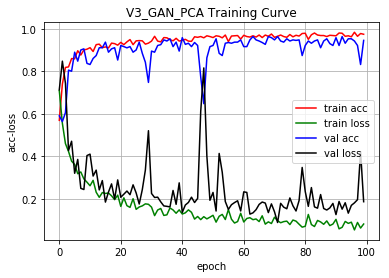

In [9]:
#model.compile(loss='categorical_crossentropy',
#              optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),
#              metrics=['accuracy'])
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.SGD(lr=1e-4, momentum=0.9),
              metrics=['accuracy'])

# prepare data augmentation configuration
train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=40,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest',
        validation_split=0.2)

#test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training')

validation_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation')


history = LossHistory()
filepath="/media/disk1/Necrosis/model/" + model_name + "_weights-improvement-{epoch:02d}-{val_acc:.2f}.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True,
mode='max')
# fine-tune the model
hist = model.fit_generator(
       train_generator,
       steps_per_epoch=42,
       epochs=epochs,
       validation_data=validation_generator,
       validation_steps=10,
       callbacks=[history,checkpoint])

loss_history_path = os.path.join(model_name +'_loss_history_epoch.log')
myFile = open(loss_history_path, 'w+')
myFile.write(str(hist.history))
myFile.close()
# print model.predict_generator(validation_generator, steps=1)

model.save_weights(full_model_weights_path)

model.save(full_model_path)
history.loss_plot('epoch',model_name)

In [7]:
train_generator.class_indices

{'.ipynb_checkpoints': 0,
 'Original_Stroma_Train': 1,
 'Original_Tumour_Train': 2}

In [2]:
!cp -r /media/pathimg/Greyscale /home/stand

In [10]:
!rm -r /home/stand/Greyscale/PCA-Reconstructed/@eaDir

In [14]:
!ls /home/stand/Greyscale/PCA-Reconstructed

Test  Train


In [50]:
!pwd

/home/stand/Necrosis


In [3]:
!ls /media/pathimg/Kather_texture_2016_image_tiles_5000

@eaDir	Inde_test  Train


In [3]:
from keras.models import load_model
model = load_model('/media/disk1/Necrosis/model/Dense_mvp_types_model.h5')
model.load_weights('/media/disk1/Necrosis/model/Dense_mvp_types_weights-improvement-08-0.81.hdf5')

In [ ]:
import pandas as pd
import progressbar
from PIL import Image
import numpy as np
import time
val_path = '/media/disk1/Necrosis/Data/nor_val_patch/'
label = pd.read_csv('/home/stand/Necrosis/MVP_result_0423.csv')
#positivepatches = label[label.Median>0.5].file.values
positivepatches = label.file.values
Dense_val = pd.DataFrame(columns=['file','MVP_score'])
widgets=[' [', progressbar.Timer(), '] ',progressbar.Bar(),'[', progressbar.SimpleProgress(), ']',' (', progressbar.ETA(), ') ',]
for i in progressbar.progressbar(range(len(positivepatches)), widgets=widgets):
    img = Image.open(val_path+positivepatches[i])
    img = img.convert('RGB')
    resize_img = img.resize((512,512),Image.ANTIALIAS)
    resize_arr = np.asarray(resize_img,dtype="float32")
    temp = np.empty((1,512,512,3),dtype="float32")
    temp[0,:,:,:] = resize_arr
    Pred_data = temp.astype('float32')
    Pred_data /= 255.0
    pred_result = model.predict(Pred_data)
    pred_final = pred_result[0]
    #temp = pd.DataFrame([valpatches[i],pred_final[0],pred_final[1],pred_final[2]]).T
    temp = pd.DataFrame([positivepatches[i],pred_final[0]]).T
    temp.columns = Dense_val.columns
    Dense_val = pd.concat([Dense_val,temp],ignore_index=True)
    time.sleep(0.01)
Dense_val.to_csv('Dense_mvp_types.csv')

 [Elapsed Time: 0:36:28] |###########        |[9370 of 16183] (ETA:   0:26:31) 

In [35]:
img = Image.open(val_path+'128988_17_9.jpeg')

In [1]:
import os, time
import numpy as np
import pandas as pd
from keras.models import load_model
from PIL import Image
import openslide
from math import floor
import glob
import progressbar
import staintools
from staintools import ReinhardColorNormalizer
import sys
import gc
os.environ["CUDA_VISIBLE_DEVICES"]="2"

Using TensorFlow backend.


In [2]:
val_path = '/home/stand/Greyscale/Original/Test/Original_Tumour_Test/'
valpatches = [f for f in os.listdir(val_path) if f.endswith('.png')]
CSIS_ori = pd.DataFrame(columns=['file','label','Predict'])
classifier = load_model('/media/disk1/Necrosis/model/V3_grey_ori_model.h5')
classifier.load_weights('/media/disk1/Necrosis/model/V3_grey_ori_weights-improvement-46-1.00.hdf5')
widgets=[' [', progressbar.Timer(), '] ',progressbar.Bar(),'[', progressbar.SimpleProgress(), ']',' (', progressbar.ETA(), ') ',]
for i in progressbar.progressbar(range(len(valpatches)), widgets=widgets):
    img = Image.open(val_path+valpatches[i])
    img = img.convert('RGB')
    resize_img = img.resize((150,150),Image.ANTIALIAS)
    resize_arr = np.asarray(resize_img,dtype="float32")
    temp = np.empty((1,150,150,3),dtype="float32")
    temp[0,:,:,:] = resize_arr
    Pred_data = temp.astype('float32')
    Pred_data /= 255.0
    pred_result = classifier.predict(Pred_data)
    pred_final = pred_result[0,0]
    temp = pd.DataFrame(['Tomour_'+valpatches[i],0,pred_final]).T
    temp.columns = CSIS_ori.columns
    CSIS_ori = pd.concat([CSIS_ori,temp],ignore_index=True)
    time.sleep(0.01)
#CSIS_val.to_csv('Dense_MP.csv')

 [Elapsed Time: 0:00:06] |######################|[100 of 100] (Time:  0:00:06) 


In [3]:
val_path = '/home/stand/Greyscale/Original/Test/Original_Stroma_Test/'
valpatches = [f for f in os.listdir(val_path) if f.endswith('.png')]
widgets=[' [', progressbar.Timer(), '] ',progressbar.Bar(),'[', progressbar.SimpleProgress(), ']',' (', progressbar.ETA(), ') ',]
for i in progressbar.progressbar(range(len(valpatches)), widgets=widgets):
    img = Image.open(val_path+valpatches[i])
    img = img.convert('RGB')
    resize_img = img.resize((150,150),Image.ANTIALIAS)
    resize_arr = np.asarray(resize_img,dtype="float32")
    temp = np.empty((1,150,150,3),dtype="float32")
    temp[0,:,:,:] = resize_arr
    Pred_data = temp.astype('float32')
    Pred_data /= 255.0
    pred_result = classifier.predict(Pred_data)
    pred_final = pred_result[0,0]
    temp = pd.DataFrame(['Stroma_'+valpatches[i],1,pred_final]).T
    temp.columns = CSIS_ori.columns
    CSIS_ori = pd.concat([CSIS_ori,temp],ignore_index=True)
    time.sleep(0.01)

 [Elapsed Time: 0:00:03] |######################|[100 of 100] (Time:  0:00:03) 


In [4]:
val_path = '/home/stand/Greyscale/Original/Test/Original_Tumour_Test/'
valpatches = [f for f in os.listdir(val_path) if f.endswith('.png')]
CSIS_GAN = pd.DataFrame(columns=['file','label','Predict'])
classifier = load_model('/media/disk1/Necrosis/model/V3_GAN_model.h5')
classifier.load_weights('/media/disk1/Necrosis/model/V3_GAN_weights-improvement-78-0.99.hdf5')
widgets=[' [', progressbar.Timer(), '] ',progressbar.Bar(),'[', progressbar.SimpleProgress(), ']',' (', progressbar.ETA(), ') ',]
for i in progressbar.progressbar(range(len(valpatches)), widgets=widgets):
    img = Image.open(val_path+valpatches[i])
    img = img.convert('RGB')
    resize_img = img.resize((150,150),Image.ANTIALIAS)
    resize_arr = np.asarray(resize_img,dtype="float32")
    temp = np.empty((1,150,150,3),dtype="float32")
    temp[0,:,:,:] = resize_arr
    Pred_data = temp.astype('float32')
    Pred_data /= 255.0
    pred_result = classifier.predict(Pred_data)
    pred_final = pred_result[0,0]
    temp = pd.DataFrame(['Tomour_'+valpatches[i],0,pred_final]).T
    temp.columns = CSIS_GAN.columns
    CSIS_GAN = pd.concat([CSIS_GAN,temp],ignore_index=True)
    time.sleep(0.01)
#CSIS_val.to_csv('Dense_MP.csv')

 [Elapsed Time: 0:00:06] |######################|[100 of 100] (Time:  0:00:06) 


In [5]:
val_path = '/home/stand/Greyscale/Original/Test/Original_Stroma_Test/'
valpatches = [f for f in os.listdir(val_path) if f.endswith('.png')]
widgets=[' [', progressbar.Timer(), '] ',progressbar.Bar(),'[', progressbar.SimpleProgress(), ']',' (', progressbar.ETA(), ') ',]
for i in progressbar.progressbar(range(len(valpatches)), widgets=widgets):
    img = Image.open(val_path+valpatches[i])
    img = img.convert('RGB')
    resize_img = img.resize((150,150),Image.ANTIALIAS)
    resize_arr = np.asarray(resize_img,dtype="float32")
    temp = np.empty((1,150,150,3),dtype="float32")
    temp[0,:,:,:] = resize_arr
    Pred_data = temp.astype('float32')
    Pred_data /= 255.0
    pred_result = classifier.predict(Pred_data)
    pred_final = pred_result[0,0]
    temp = pd.DataFrame(['Stroma_'+valpatches[i],1,pred_final]).T
    temp.columns = CSIS_GAN.columns
    CSIS_GAN = pd.concat([CSIS_GAN,temp],ignore_index=True)
    time.sleep(0.01)

 [Elapsed Time: 0:00:03] |######################|[100 of 100] (Time:  0:00:03) 


In [6]:
val_path = '/home/stand/Greyscale/PCA-Reconstructed/Test/PCA_Tumour_Test/'
valpatches = [f for f in os.listdir(val_path) if f.endswith('.png')]
CSIS_PCA = pd.DataFrame(columns=['file','label','Predict'])
classifier = load_model('/media/disk1/Necrosis/model/V3_PCA_model.h5')
classifier.load_weights('/media/disk1/Necrosis/model/V3_PCA_weights-improvement-37-0.97.hdf5')
widgets=[' [', progressbar.Timer(), '] ',progressbar.Bar(),'[', progressbar.SimpleProgress(), ']',' (', progressbar.ETA(), ') ',]
for i in progressbar.progressbar(range(len(valpatches)), widgets=widgets):
    img = Image.open(val_path+valpatches[i])
    img = img.convert('RGB')
    resize_img = img.resize((150,150),Image.ANTIALIAS)
    resize_arr = np.asarray(resize_img,dtype="float32")
    temp = np.empty((1,150,150,3),dtype="float32")
    temp[0,:,:,:] = resize_arr
    Pred_data = temp.astype('float32')
    Pred_data /= 255.0
    pred_result = classifier.predict(Pred_data)
    pred_final = pred_result[0,0]
    temp = pd.DataFrame(['Tomour_'+valpatches[i],0,pred_final]).T
    temp.columns = CSIS_PCA.columns
    CSIS_PCA = pd.concat([CSIS_PCA,temp],ignore_index=True)
    time.sleep(0.01)
#CSIS_val.to_csv('Dense_MP.csv')

 [Elapsed Time: 0:00:07] |######################|[100 of 100] (Time:  0:00:07) 


In [7]:
val_path = '/home/stand/Greyscale/PCA-Reconstructed/Test/PCA_Stroma_Test/'
valpatches = [f for f in os.listdir(val_path) if f.endswith('.png')]
widgets=[' [', progressbar.Timer(), '] ',progressbar.Bar(),'[', progressbar.SimpleProgress(), ']',' (', progressbar.ETA(), ') ',]
for i in progressbar.progressbar(range(len(valpatches)), widgets=widgets):
    img = Image.open(val_path+valpatches[i])
    img = img.convert('RGB')
    resize_img = img.resize((150,150),Image.ANTIALIAS)
    resize_arr = np.asarray(resize_img,dtype="float32")
    temp = np.empty((1,150,150,3),dtype="float32")
    temp[0,:,:,:] = resize_arr
    Pred_data = temp.astype('float32')
    Pred_data /= 255.0
    pred_result = classifier.predict(Pred_data)
    pred_final = pred_result[0,0]
    temp = pd.DataFrame(['Stroma_'+valpatches[i],1,pred_final]).T
    temp.columns = CSIS_PCA.columns
    CSIS_PCA = pd.concat([CSIS_PCA,temp],ignore_index=True)
    time.sleep(0.01)

 [Elapsed Time: 0:00:03] |######################|[100 of 100] (Time:  0:00:03) 


In [8]:
val_path = '/home/stand/Greyscale/PCA-Reconstructed/Test/PCA_Tumour_Test/'
valpatches = [f for f in os.listdir(val_path) if f.endswith('.png')]
CSIS_PCA_GAN = pd.DataFrame(columns=['file','label','Predict'])
classifier = load_model('/media/disk1/Necrosis/model/V3_GAN_PCA_model.h5')
classifier.load_weights('/media/disk1/Necrosis/model/V3_GAN_PCA_weights-improvement-72-0.96.hdf5')
widgets=[' [', progressbar.Timer(), '] ',progressbar.Bar(),'[', progressbar.SimpleProgress(), ']',' (', progressbar.ETA(), ') ',]
for i in progressbar.progressbar(range(len(valpatches)), widgets=widgets):
    img = Image.open(val_path+valpatches[i])
    img = img.convert('RGB')
    resize_img = img.resize((150,150),Image.ANTIALIAS)
    resize_arr = np.asarray(resize_img,dtype="float32")
    temp = np.empty((1,150,150,3),dtype="float32")
    temp[0,:,:,:] = resize_arr
    Pred_data = temp.astype('float32')
    Pred_data /= 255.0
    pred_result = classifier.predict(Pred_data)
    pred_final = pred_result[0,0]
    temp = pd.DataFrame(['Tomour_'+valpatches[i],0,pred_final]).T
    temp.columns = CSIS_PCA_GAN.columns
    CSIS_PCA_GAN = pd.concat([CSIS_PCA_GAN,temp],ignore_index=True)
    time.sleep(0.01)

 [Elapsed Time: 0:00:09] |######################|[100 of 100] (Time:  0:00:09) 


In [9]:
val_path = '/home/stand/Greyscale/PCA-Reconstructed/Test/PCA_Stroma_Test/'
valpatches = [f for f in os.listdir(val_path) if f.endswith('.png')]
widgets=[' [', progressbar.Timer(), '] ',progressbar.Bar(),'[', progressbar.SimpleProgress(), ']',' (', progressbar.ETA(), ') ',]
for i in progressbar.progressbar(range(len(valpatches)), widgets=widgets):
    img = Image.open(val_path+valpatches[i])
    img = img.convert('RGB')
    resize_img = img.resize((150,150),Image.ANTIALIAS)
    resize_arr = np.asarray(resize_img,dtype="float32")
    temp = np.empty((1,150,150,3),dtype="float32")
    temp[0,:,:,:] = resize_arr
    Pred_data = temp.astype('float32')
    Pred_data /= 255.0
    pred_result = classifier.predict(Pred_data)
    pred_final = pred_result[0,0]
    temp = pd.DataFrame(['Stroma_'+valpatches[i],1,pred_final]).T
    temp.columns = CSIS_PCA_GAN.columns
    CSIS_PCA_GAN = pd.concat([CSIS_PCA_GAN,temp],ignore_index=True)
    time.sleep(0.01)

 [Elapsed Time: 0:00:03] |######################|[100 of 100] (Time:  0:00:03) 


In [10]:
CSIS_ori = CSIS_ori.rename(columns={'Predict':'ori'})

In [11]:
CSIS_GAN = CSIS_GAN.rename(columns={'Predict':'GAN'})

In [12]:
CSIS_PCA = CSIS_PCA.rename(columns={'Predict':'PCA'})

In [13]:
CSIS_PCA_GAN = CSIS_PCA_GAN.rename(columns={'Predict':'PCA_GAN'})

In [14]:
compare_GAN = pd.merge(CSIS_ori,CSIS_GAN)

In [15]:
compare_PCA = pd.merge(CSIS_PCA,CSIS_PCA_GAN)

In [16]:
compare_all = pd.merge(compare_GAN,compare_PCA)

In [30]:
compare_all

,file,label,ori,GAN,PCA,PCA_GAN
0,Tomour_42.png,0,0.00763803,0.145005,0.81005,0.206016
1,Tomour_8.png,0,2.1148e-05,8.70297e-06,0.998695,0.88799
2,Tomour_64.png,0,0.108203,0.0137156,0.719386,0.469244
3,Tomour_63.png,0,4.53965e-05,1.37653e-05,0.912464,0.736053
4,Tomour_62.png,0,1.25543e-05,0.000226794,0.997144,0.935679
...,...,...,...,...,...,...
195,Stroma_89.png,1,0.753357,0.950585,0.999989,0.996358
196,Stroma_85.png,1,0.995393,0.975842,0.999478,0.996722
197,Stroma_26.png,1,0.998851,0.999746,0.999975,0.824225
198,Stroma_3.png,1,0.999619,0.999824,0.989139,0.999587


In [17]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from scipy import stats
from sklearn import metrics
from sklearn.metrics import roc_auc_score

from sklearn.datasets import make_classification
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import average_precision_score

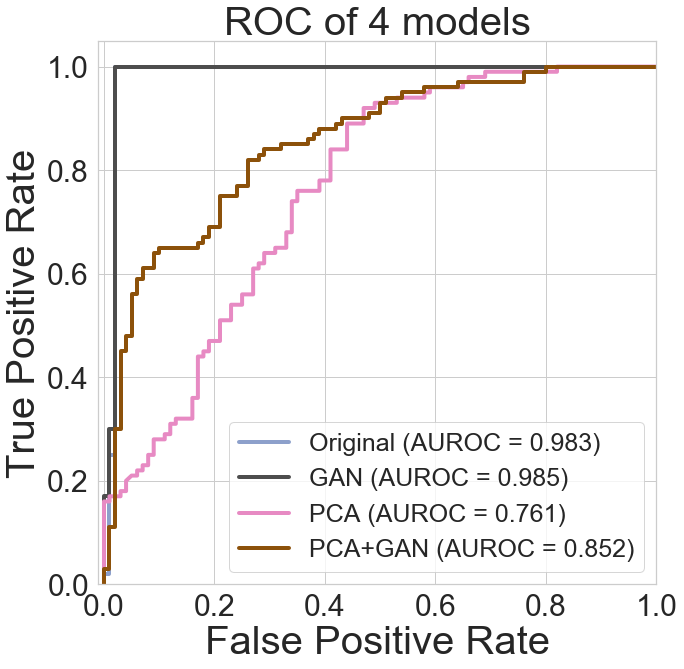

In [23]:
colormap = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
#sns.set_palette("husl")
plt.figure(figsize=(10,10))
sns.set(style="whitegrid")
y = compare_all['label'].astype('float')

scores = compare_all['ori']
fpr, tpr, thresholds = metrics.roc_curve(y, scores, pos_label=1)
roc_auc = roc_auc_score(y, scores)
plt.plot(fpr, tpr,label='Original (AUROC = %0.3f)' % roc_auc, linewidth=4, color = "#8da0cb")

scores = compare_all['GAN']
fpr, tpr, thresholds = metrics.roc_curve(y, scores, pos_label=1)
roc_auc = roc_auc_score(y, scores)
plt.plot(fpr, tpr,label='GAN (AUROC = %0.3f)' % roc_auc, linewidth=4, color = "#4d4d4d")
         
scores = compare_all['PCA']
fpr, tpr, thresholds = metrics.roc_curve(y, scores, pos_label=1)
roc_auc = roc_auc_score(y, scores)
plt.plot(fpr, tpr,label='PCA (AUROC = %0.3f)' % roc_auc, linewidth=4, color = "#e78ac3")
         
scores = compare_all['PCA_GAN']
fpr, tpr, thresholds = metrics.roc_curve(y, scores, pos_label=1)
roc_auc = roc_auc_score(y, scores)
plt.plot(fpr, tpr,label='PCA+GAN (AUROC = %0.3f)' % roc_auc, linewidth=4, color = "#8c510a")

#plt.plot([0, 1], [0, 1], color='navy', lw=4, linestyle='--')
plt.xlim([-0.01, 1.0])
plt.ylim([0, 1.05])
plt.xlabel('False Positive Rate',fontsize=40)
plt.ylabel('True Positive Rate',fontsize=40)
plt.title('ROC of 4 models',fontsize=40)
plt.legend(loc="lower right",fontsize=25)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.savefig('CSIC5001_ROC.png',dpi = 1000, bbox_inches='tight') 
plt.show()

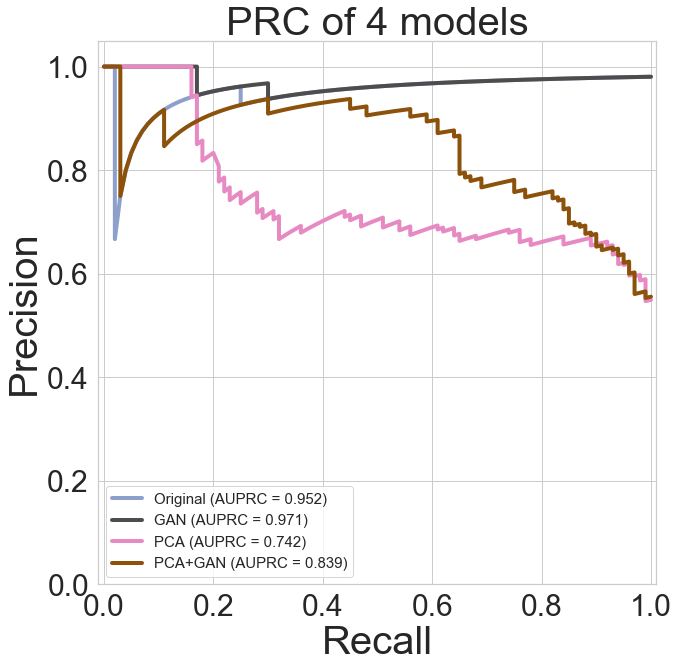

In [36]:
plt.figure(figsize=(10,10))
sns.set(style="whitegrid")
y = compare_all['label'].astype('float')

scores = compare_all['ori']
precision, recall, thresholds = precision_recall_curve(y, scores, pos_label=1)
prauc = metrics.auc(recall, precision)
plt.plot(recall, precision,label='Original (AUPRC = %0.3f)' % prauc, linewidth=4, color = "#8da0cb")
         
scores = compare_all['GAN']
precision, recall, thresholds = precision_recall_curve(y, scores, pos_label=1)
prauc = metrics.auc(recall, precision)
plt.plot(recall, precision,label='GAN (AUPRC = %0.3f)' % prauc, linewidth=4, color = "#4d4d4d")
         
scores = compare_all['PCA']
precision, recall, thresholds = precision_recall_curve(y, scores, pos_label=1)
prauc = metrics.auc(recall, precision)
plt.plot(recall, precision,label='PCA (AUPRC = %0.3f)' % prauc, linewidth=4, color = "#e78ac3")
         
scores = compare_all['PCA_GAN']
precision, recall, thresholds = precision_recall_curve(y, scores, pos_label=1)
prauc = metrics.auc(recall, precision)
plt.plot(recall, precision,label='PCA+GAN (AUPRC = %0.3f)' % prauc, linewidth=4, color = "#8c510a")
         

plt.xlim([-0.01, 1.01])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall',fontsize=40)
plt.ylabel('Precision',fontsize=40)
plt.title('PRC of 4 models',fontsize=40)
plt.legend(loc="lower left",fontsize=15)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.savefig('CSIC5001_PRC.png',dpi = 1000, bbox_inches='tight') 
plt.show()